In [1]:
from libraries import *
from parameters import *
import anndata as ad

/home/beraslan/miniconda3/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
%load_ext rpy2.ipython

In [3]:
os.getcwd()
os.chdir(projectDir)

In [4]:
adataLPSMinus = sc.read_10x_h5('./data/data_unperturbed/LPSMinus_v3_raw_feature_bc_matrix.h5').copy()
adataLPSPlus = sc.read_10x_h5('./data/data_unperturbed/LPSPlus_v3_raw_feature_bc_matrix.h5').copy()
adataLPSMinus.var_names_make_unique()
adataLPSPlus.var_names_make_unique()

reading ./data/data_unperturbed/LPSMinus_v3_raw_feature_bc_matrix.h5
 (0:00:08)


/home/beraslan/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


reading ./data/data_unperturbed/LPSPlus_v3_raw_feature_bc_matrix.h5
 (0:00:08)


/home/beraslan/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [5]:
sc.pp.filter_cells(adataLPSMinus, min_genes=800)
sc.pp.filter_genes(adataLPSMinus, min_cells=10)
sc.pp.filter_cells(adataLPSPlus, min_genes=800)
sc.pp.filter_genes(adataLPSPlus, min_cells=10)

filtered out 6789649 cells that have less than 800 genes expressed
filtered out 16039 genes that are detected in less than 10 cells
filtered out 6789764 cells that have less than 800 genes expressed
filtered out 16323 genes that are detected in less than 10 cells


In [6]:
adataLPSMinus.var['mt'] = adataLPSMinus.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adataLPSMinus, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
adataLPSPlus.var['mt'] = adataLPSPlus.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adataLPSPlus, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

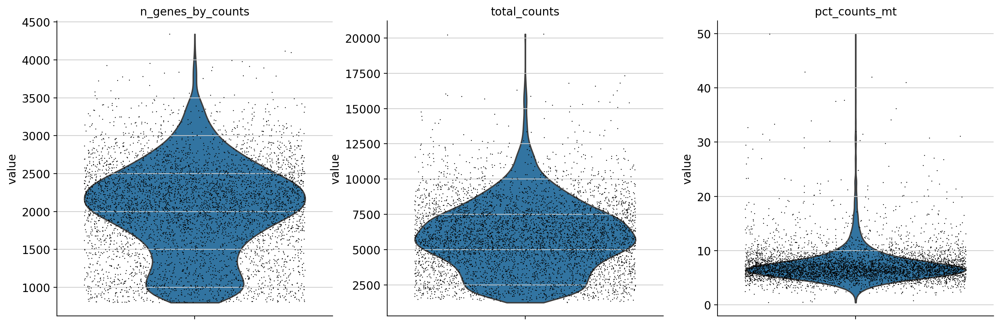

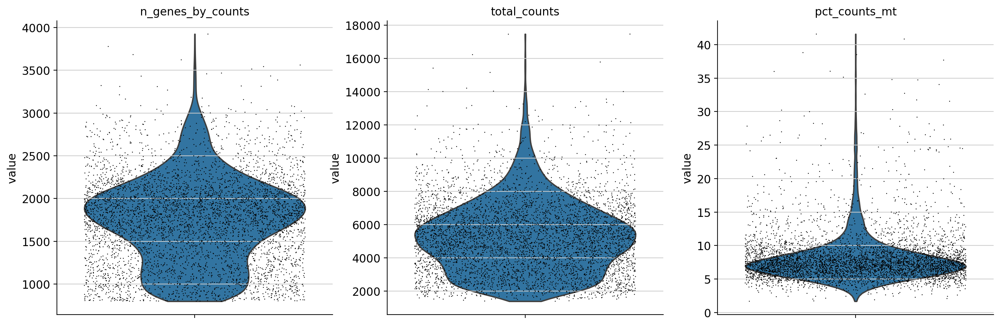

In [7]:
sc.pl.violin(adataLPSMinus, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

sc.pl.violin(adataLPSPlus, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

In [ ]:
# sc.pl.scatter(adataLPSPlus, x='total_counts', y='pct_counts_mt')
# sc.pl.scatter(adataLPSPlus, x='total_counts', y='n_genes_by_counts')
# sc.pl.scatter(adataLPSMinus, x='total_counts', y='pct_counts_mt')
# sc.pl.scatter(adataLPSMinus, x='total_counts', y='n_genes_by_counts')


In [8]:
adataLPSPlus.shape

(5116, 11675)

In [9]:
adataLPSMinus.shape

(5231, 11959)

In [10]:
5116 + 5231

10347

In [8]:
adataLPSPlus = adataLPSPlus[adataLPSPlus.obs.n_genes_by_counts < 2500, :]
adataLPSPlus = adataLPSPlus[adataLPSPlus.obs.pct_counts_mt < 10, :]
adataLPSMinus = adataLPSMinus[adataLPSMinus.obs.n_genes_by_counts < 2500, :]
adataLPSMinus = adataLPSMinus[adataLPSMinus.obs.pct_counts_mt < 10, :]

In [9]:
adataLPSPlus.obs["type"] = "LPSPlus"
adataLPSMinus.obs["type"] = "LPSMinus"

Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.


In [10]:
adataAll = ad.concat([adataLPSMinus, adataLPSPlus], join="outer")
#adataAll.var_names_make_unique()
adataAll.obs_names_make_unique()

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [11]:
adataAll

AnnData object with n_obs × n_vars = 7682 × 12180
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'type'

In [12]:
sc.pp.normalize_total(adataAll, target_sum=1e4)
sc.pp.log1p(adataAll)
adataAll.raw = adataAll


normalizing counts per cell
    finished (0:00:00)


In [13]:
sc.pp.highly_variable_genes(adataAll, n_top_genes = 2000)
sc.pp.regress_out(adataAll, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(adataAll, max_value=10)
sc.tl.pca(adataAll, svd_solver='arpack')
sc.pp.neighbors(adataAll, n_neighbors=10, n_pcs=50)


If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use


/home/beraslan/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'type' as categorical
/home/beraslan/miniconda3/lib/python3.8/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex


    finished (0:03:16)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:07)


In [14]:
sc.tl.umap(adataAll)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)


In [15]:
sc.tl.leiden(adataAll, resolution=0.5)

running Leiden clustering
    finished: found 7 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [16]:
sc.tl.diffmap(adataAll)

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.99737114 0.98442024 0.9801945  0.973788   0.9634238
     0.9599423  0.95849645 0.95584077 0.95117694 0.9420856  0.9410364
     0.9367654  0.93174857 0.9247595 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)


In [17]:
sc.tl.rank_genes_groups(adataAll, groupby="leiden", n_genes=2000, method="t-test_overestim_var")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


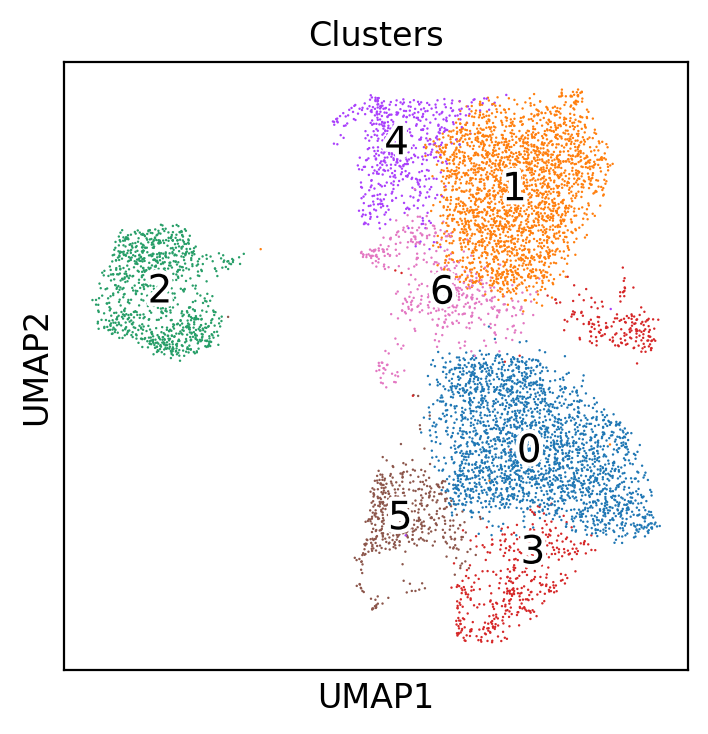

In [18]:
f, ax = plt.subplots(figsize=(4, 4))
sc.pl.umap(adataAll, color='leiden', legend_loc='on data', legend_fontoutline=3, legend_fontsize=14, legend_fontweight='normal', title='Clusters', ax=ax, show=False, size=3);

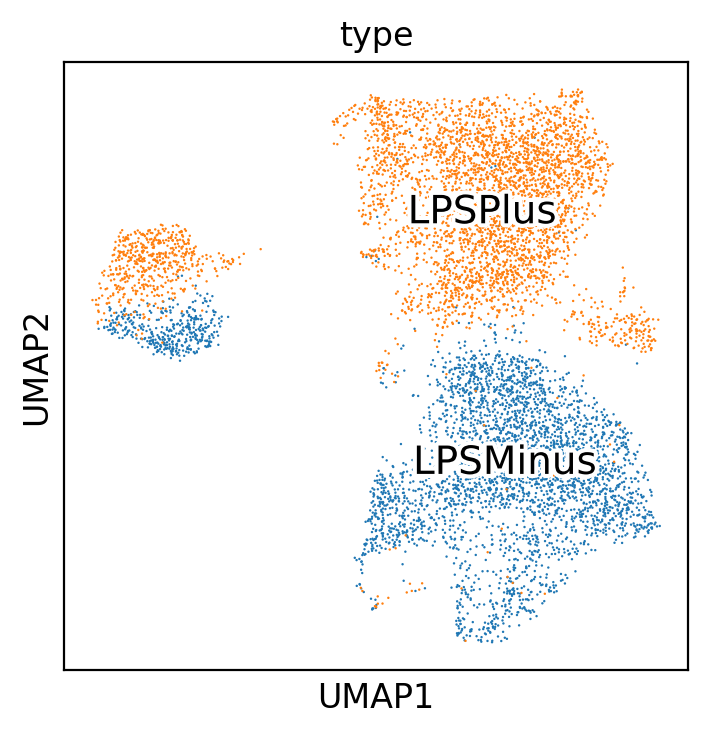

In [28]:
sc.pl.umap(adataAll, color='type', color_map="coolwarm", legend_loc='on data', legend_fontoutline=3, legend_fontsize=14, legend_fontweight='normal', size=3);

In [30]:
sc.tl.dendrogram(adataAll, groupby='leiden')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


In [31]:
dcGenes = pd.read_csv('/home/beraslan/jovian-work/analysisSingle/PositiveControls/DC_cellstate_genes.csv')
dc1Genes = dcGenes["DC1 genes"].unique()

In [33]:
sc.tl.score_genes(adata=adataAll, gene_list=dc1Genes, score_name="DC1")

computing score 'DC1'
    finished: added
    'DC1', score of gene set (adata.obs).
    1171 total control genes are used. (0:00:00)


/home/beraslan/miniconda3/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


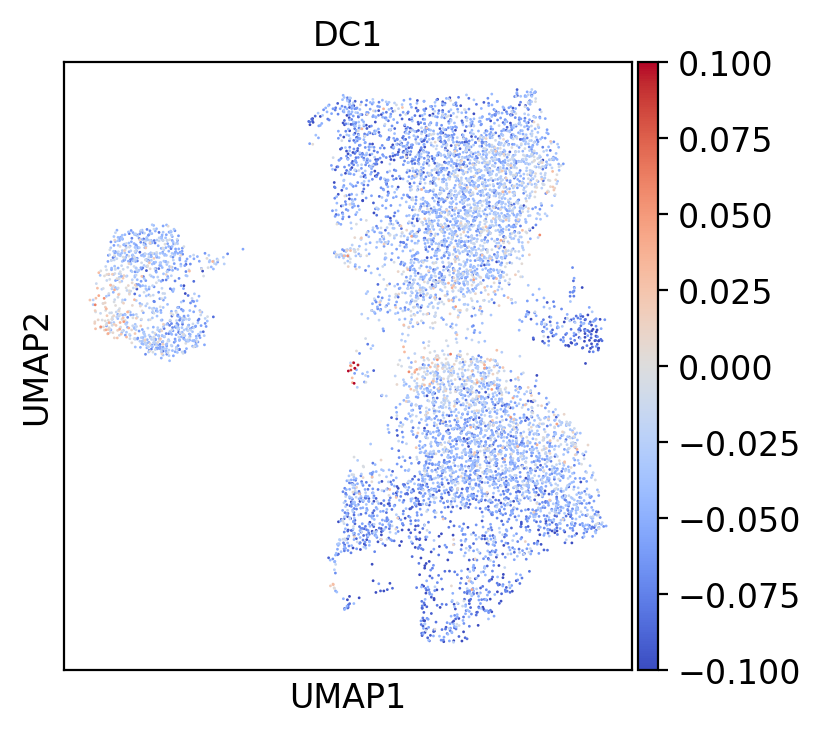

In [34]:
sc.pl.umap(adataAll, color="DC1", size=4, color_map="coolwarm", vmax=0.1, vmin=-0.1)


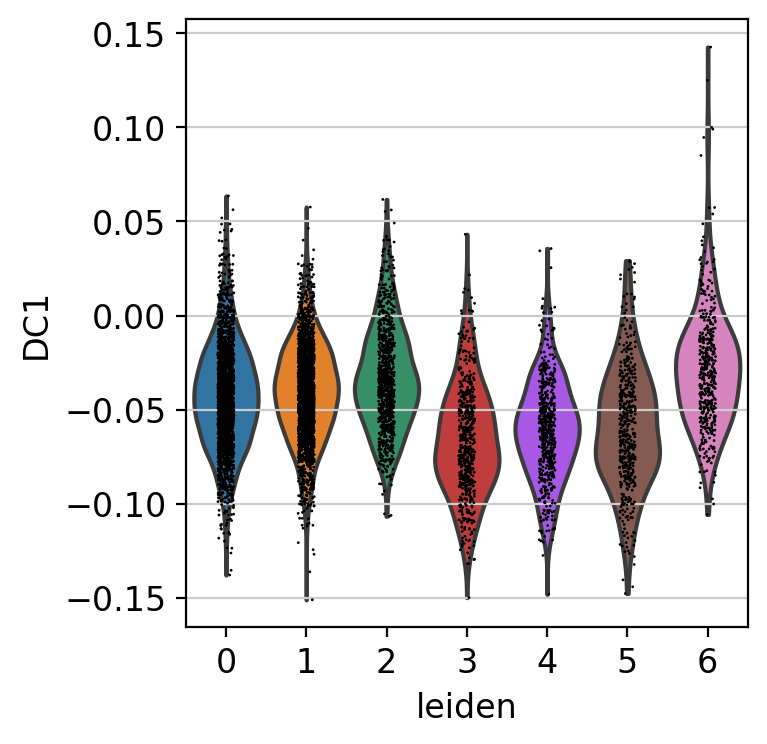

In [37]:
sc.pl.violin(adataAll, "DC1", groupby='leiden')

In [38]:
dc2Genes = dcGenes["DC2 genes"].unique()
sc.tl.score_genes(adata=adataAll, gene_list=dc2Genes, score_name="DC2")

computing score 'DC2'
    finished: added
    'DC2', score of gene set (adata.obs).
    1161 total control genes are used. (0:00:00)


/home/beraslan/miniconda3/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


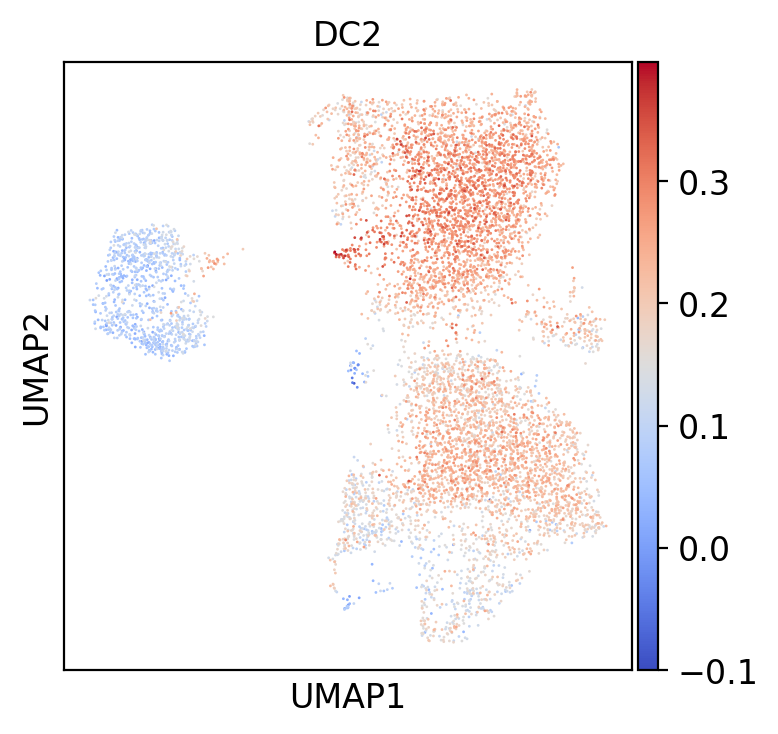

In [39]:
sc.pl.umap(adataAll, color="DC2", size=4, color_map="coolwarm", vmin=-0.1)


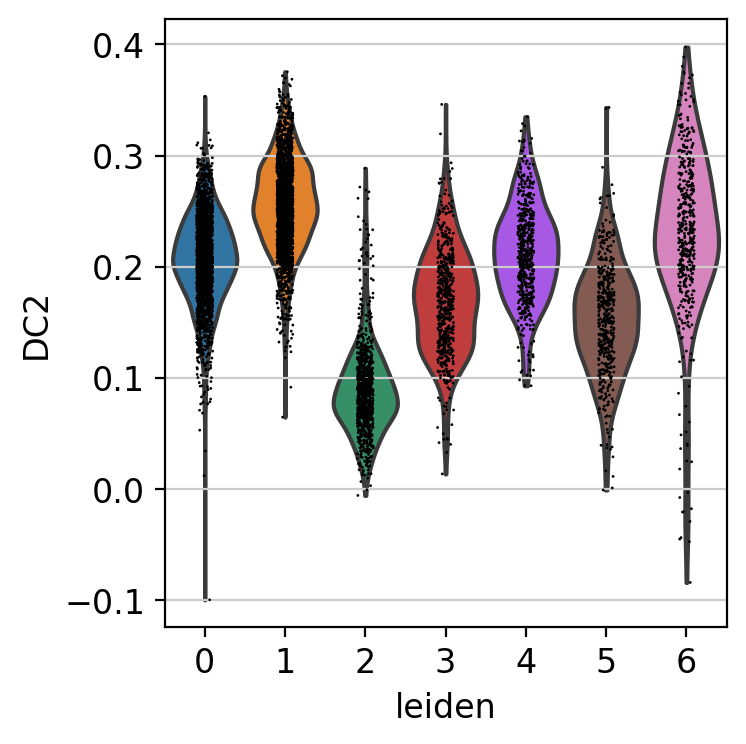

In [40]:
sc.pl.violin(adataAll, "DC2", groupby='leiden')

In [41]:
mregGenes = dcGenes["mregDC genes"].unique()
sc.tl.score_genes(adata=adataAll, gene_list=mregGenes, score_name="mreg")


computing score 'mreg'
    finished: added
    'mreg', score of gene set (adata.obs).
    1134 total control genes are used. (0:00:00)


/home/beraslan/miniconda3/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


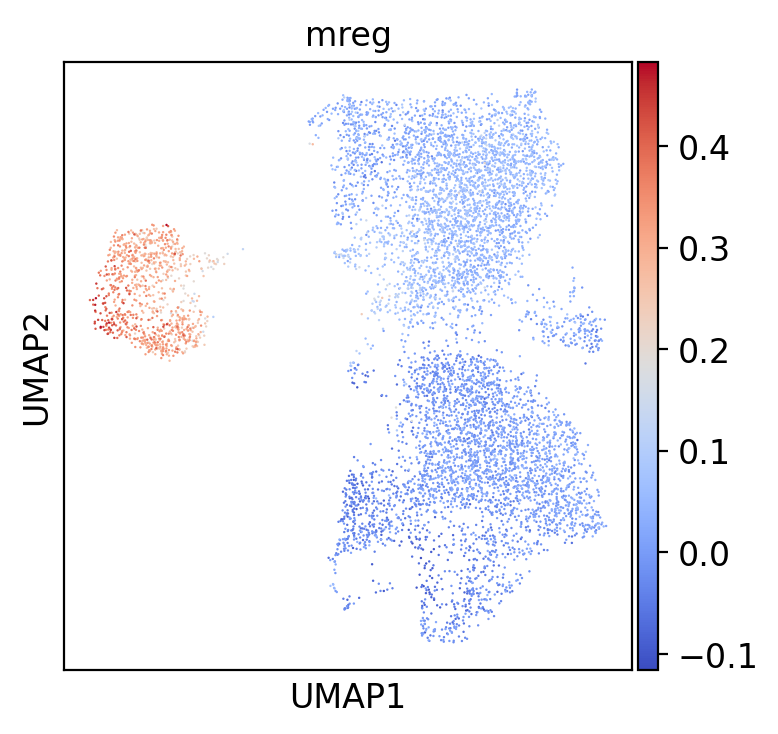

In [42]:
sc.pl.umap(adataAll, color="mreg", size=3, color_map="coolwarm")


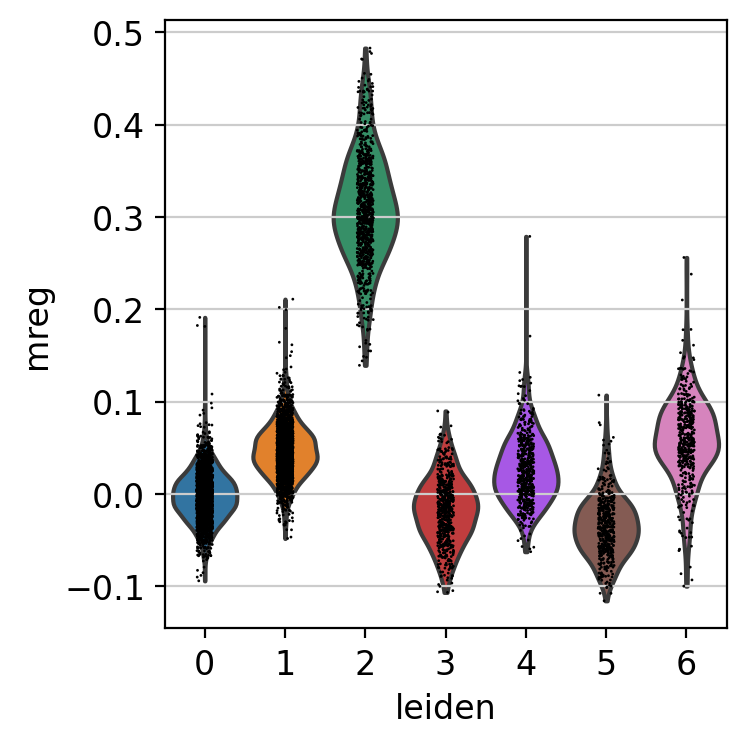

In [43]:
sc.pl.violin(adataAll, "mreg", groupby='leiden')

In [44]:
macGenes = dcGenes["Macrophage genes"].unique()
sc.tl.score_genes(adata=adataAll, gene_list=macGenes, score_name="Mac")


computing score 'Mac'
    finished: added
    'Mac', score of gene set (adata.obs).
    1162 total control genes are used. (0:00:00)


/home/beraslan/miniconda3/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


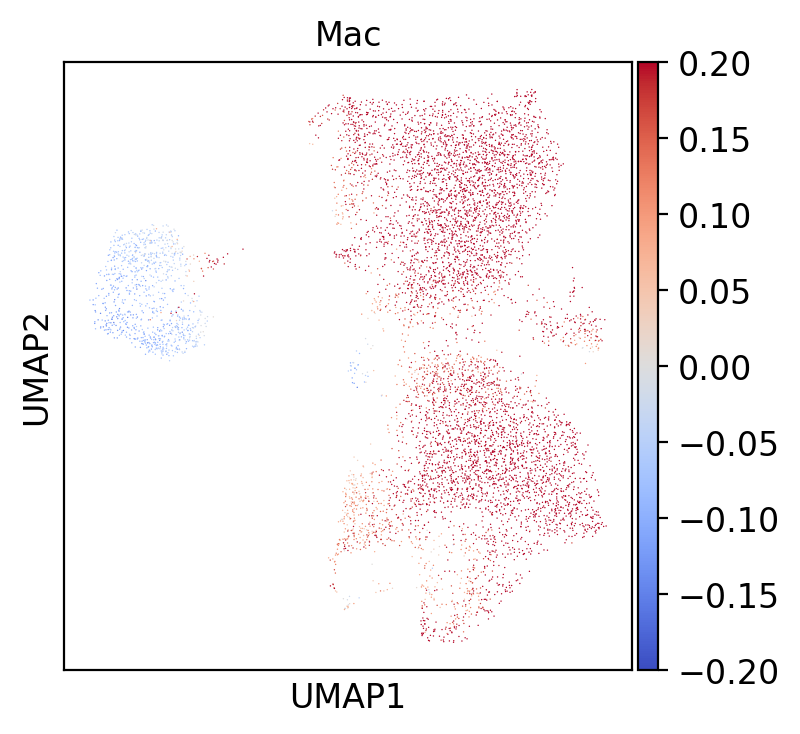

In [45]:
sc.pl.umap(adataAll, color="Mac", size=1, color_map="coolwarm", vmax=0.2, vmin=-0.2)


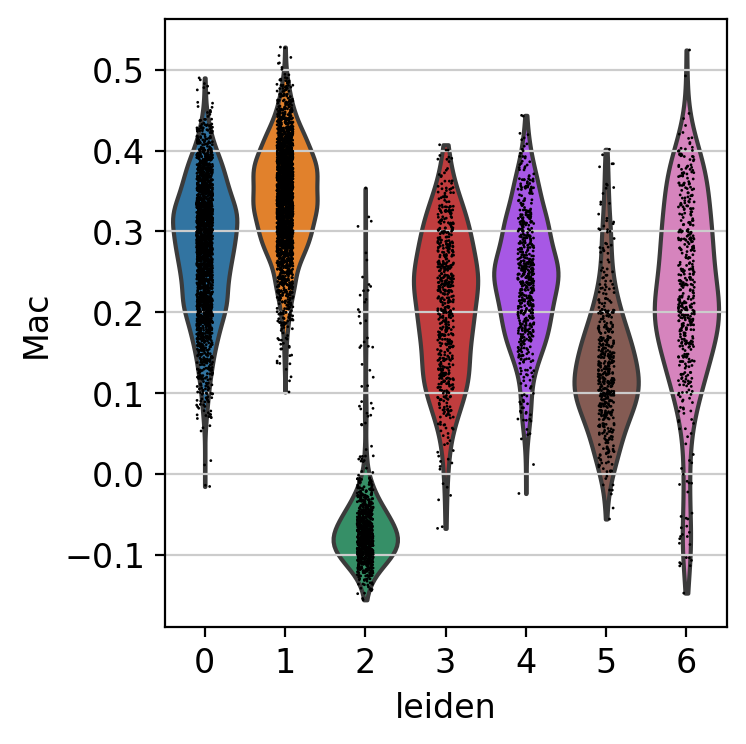

In [46]:
sc.pl.violin(adataAll, "Mac", groupby='leiden')

In [47]:
allDCgenes = np.concatenate((dc1Genes, dc2Genes, mregGenes))
sc.tl.score_genes(adata=adataAll, gene_list=allDCgenes, score_name="DCSig")

computing score 'DCSig'
    finished: added
    'DCSig', score of gene set (adata.obs).
    1071 total control genes are used. (0:00:00)


/home/beraslan/miniconda3/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


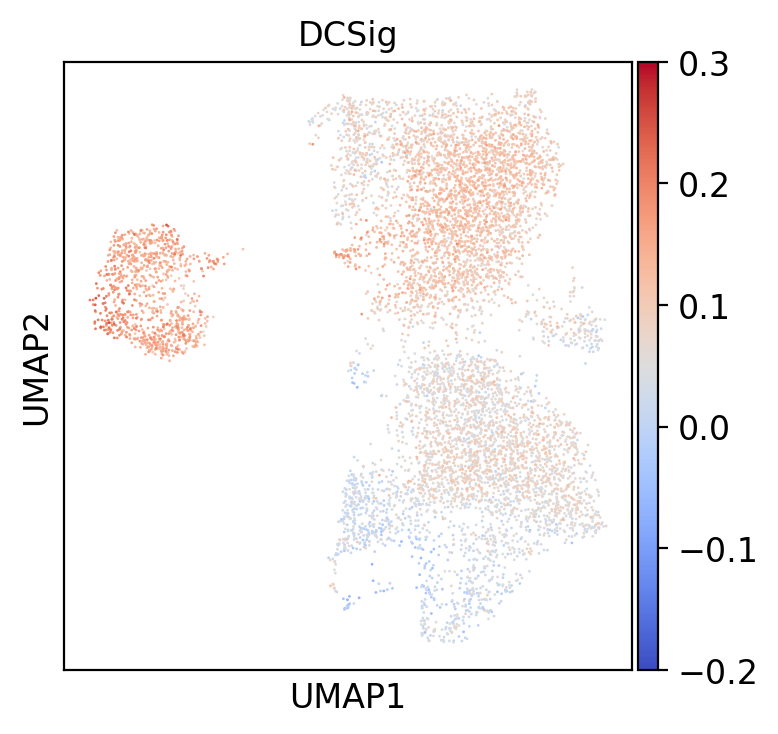

In [48]:
sc.pl.umap(adataAll, color="DCSig", size=4, color_map="coolwarm", vmin=-0.2, vmax=0.3)

In [49]:
adataAll.obs["DCSig_zscore"] = scipy.stats.zscore(adataAll.obs["DCSig"])
adataAll.obs["Mac_zscore"] = scipy.stats.zscore(adataAll.obs["Mac"])

In [50]:
adataAll.obs["MACoverDC"] = adataAll.obs["Mac_zscore"] - adataAll.obs["DCSig_zscore"]

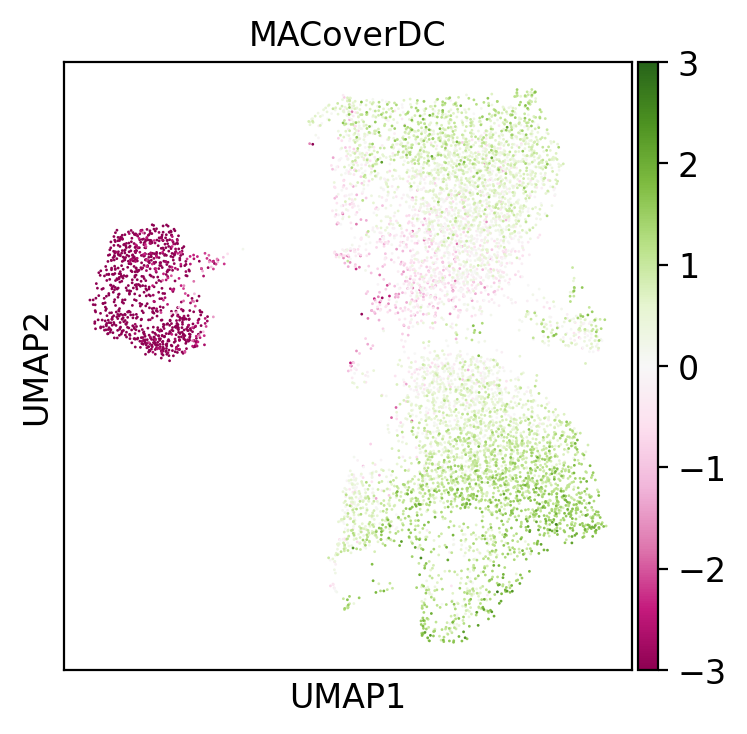

In [51]:
sc.pl.umap(adataAll, color="MACoverDC", size=4, color_map="PiYG", vmin=-3, vmax=3)


In [52]:
gene_list_url = 'https://raw.githubusercontent.com/theislab/scanpy_usage/master/180209_cell_cycle/data/regev_lab_cell_cycle_genes.txt'

cell_cycle_genes = [str(x.strip(), 'utf-8').capitalize() for x in urlopen(gene_list_url)] # capitalize = shame


s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]


sc.tl.score_genes_cell_cycle(adataAll, s_genes=s_genes, g2m_genes=g2m_genes)

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    726 total control genes are used. (0:00:00)
computing score 'G2M_score'


/home/beraslan/miniconda3/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'G2M_score', score of gene set (adata.obs).
    898 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


/home/beraslan/miniconda3/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


/home/beraslan/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'phase' as categorical


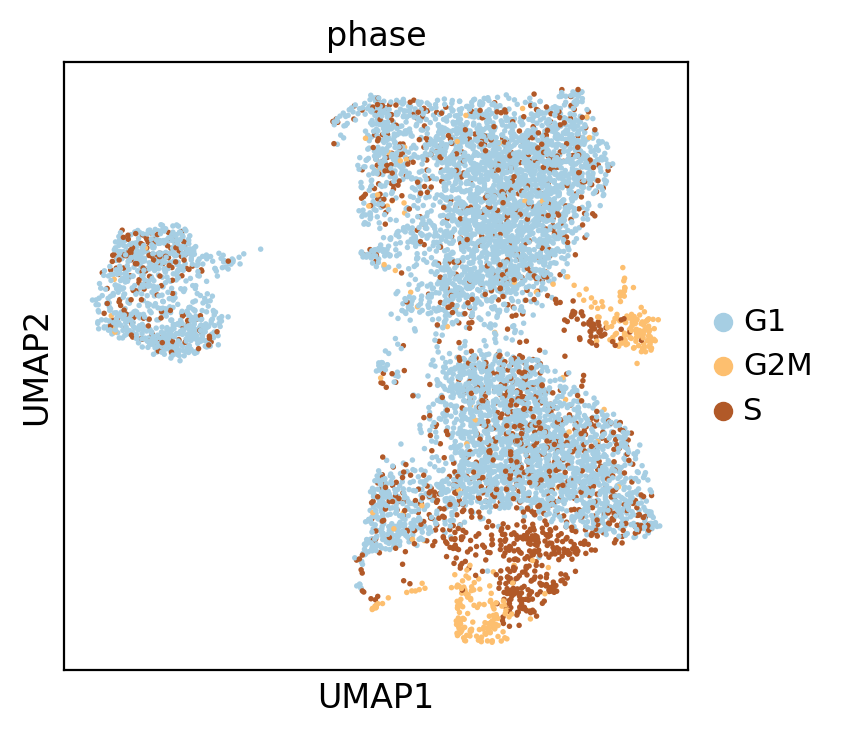

In [53]:
sc.pl.umap(adataAll, color='phase', palette = "Paired" )

In [74]:
leidenMarkersOfPerturbedCells = pd.read_csv("/home/beraslan/jovian-work/analysisSingle/Leiden_top100Markers.csv")

In [75]:
leidenMarkersOfPerturbedCells = leidenMarkersOfPerturbedCells.groupby('group').head(50)

computing score 'LeidenPert 0'
    finished: added
    'LeidenPert 0', score of gene set (adata.obs).
    396 total control genes are used. (0:00:00)


/home/beraslan/miniconda3/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


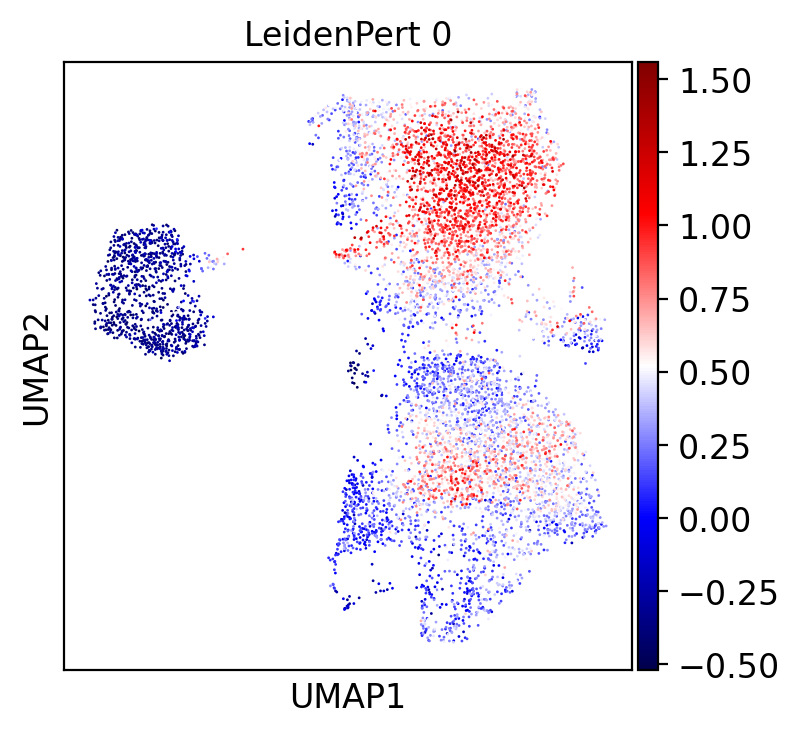

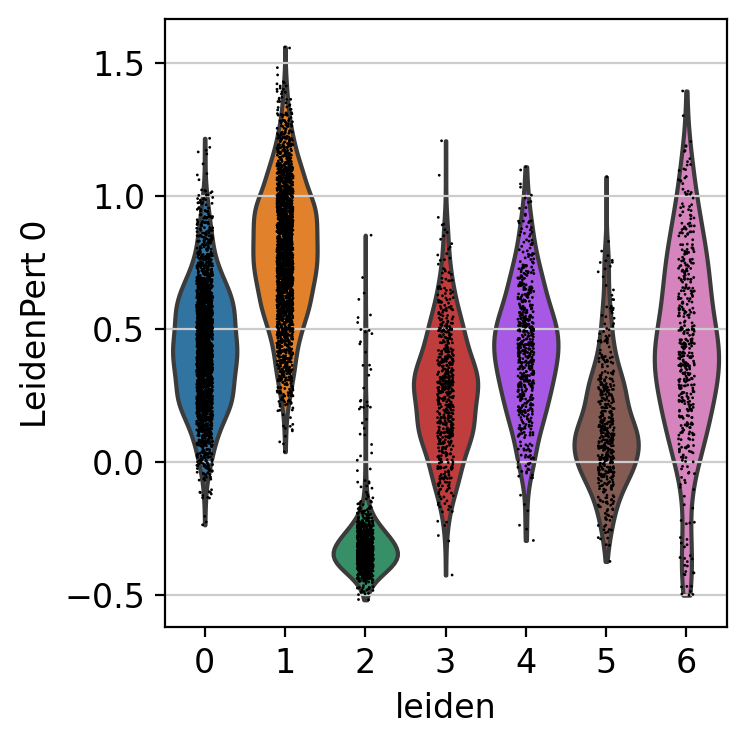

computing score 'LeidenPert 1'
    finished: added
    'LeidenPert 1', score of gene set (adata.obs).
    742 total control genes are used. (0:00:00)


/home/beraslan/miniconda3/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


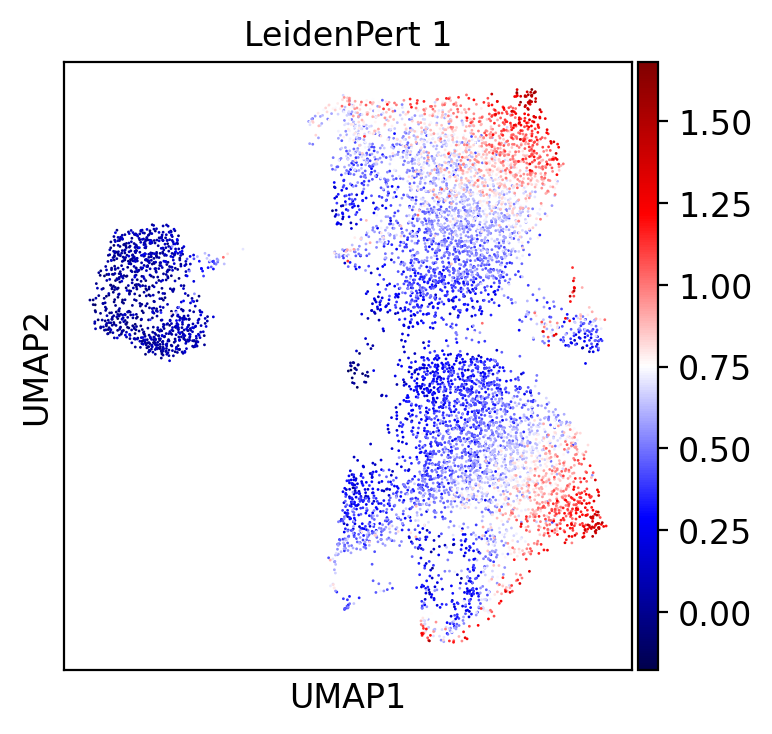

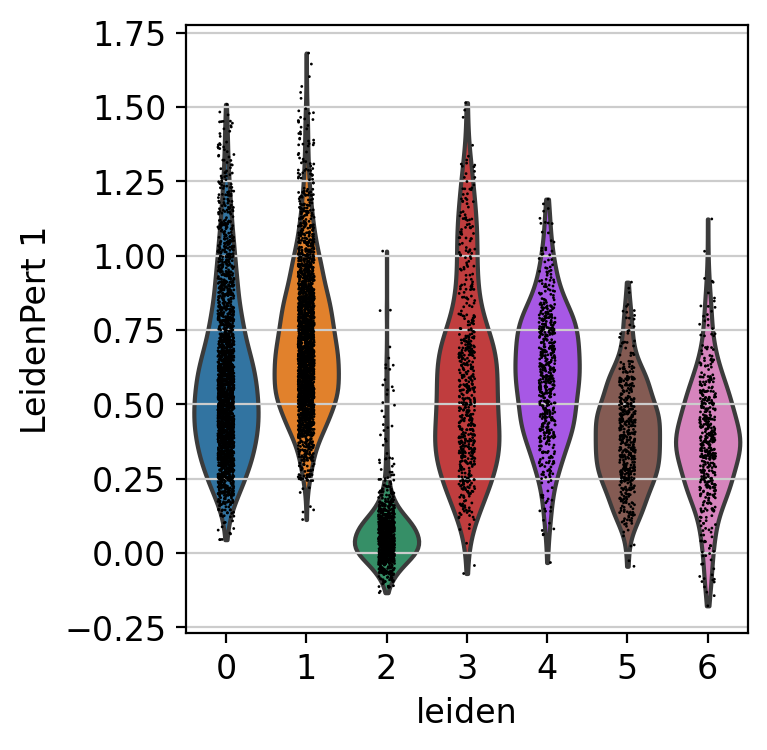

computing score 'LeidenPert 2'
    finished: added
    'LeidenPert 2', score of gene set (adata.obs).
    343 total control genes are used. (0:00:00)


/home/beraslan/miniconda3/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


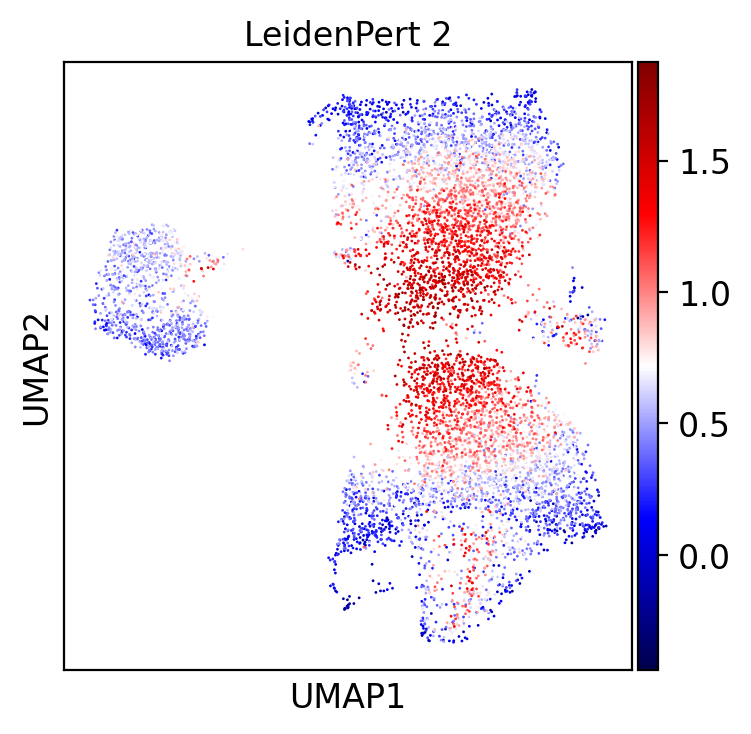

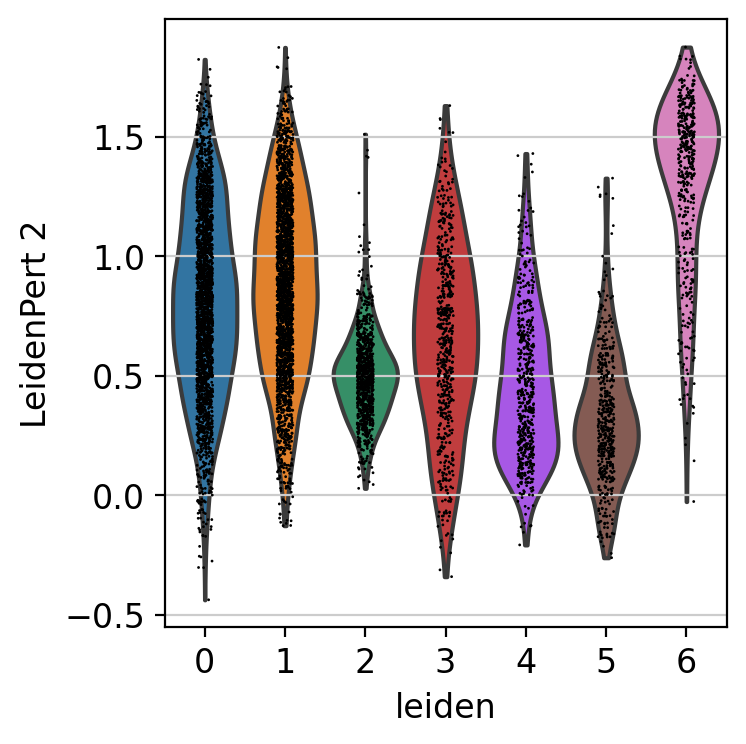

computing score 'LeidenPert 3'
    finished: added
    'LeidenPert 3', score of gene set (adata.obs).
    845 total control genes are used. (0:00:00)


/home/beraslan/miniconda3/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


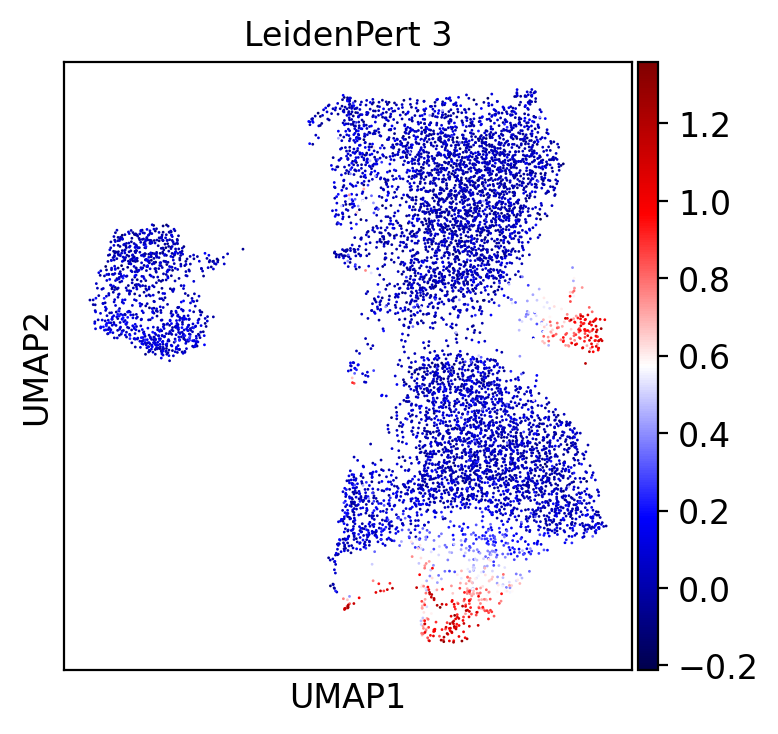

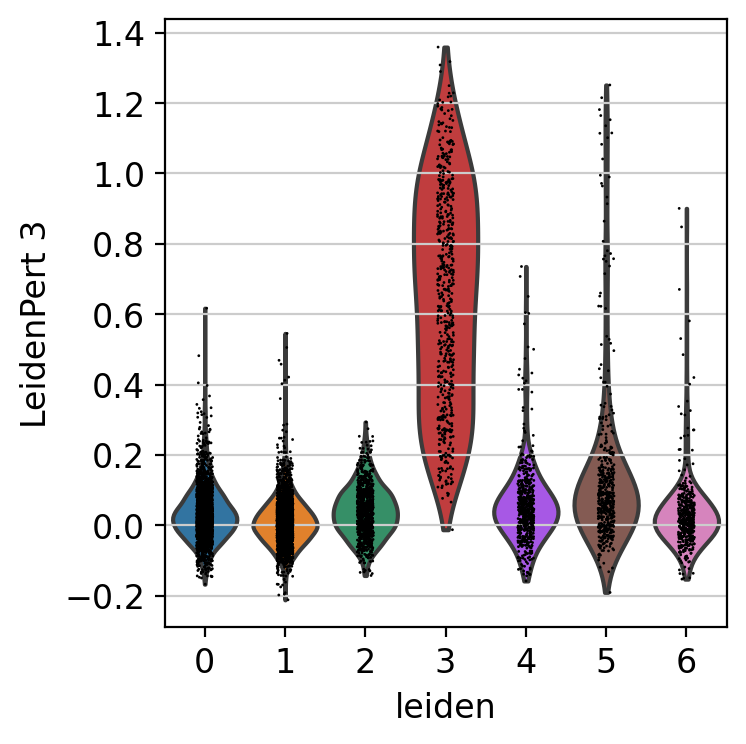

computing score 'LeidenPert 4'
    finished: added
    'LeidenPert 4', score of gene set (adata.obs).
    796 total control genes are used. (0:00:00)


/home/beraslan/miniconda3/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


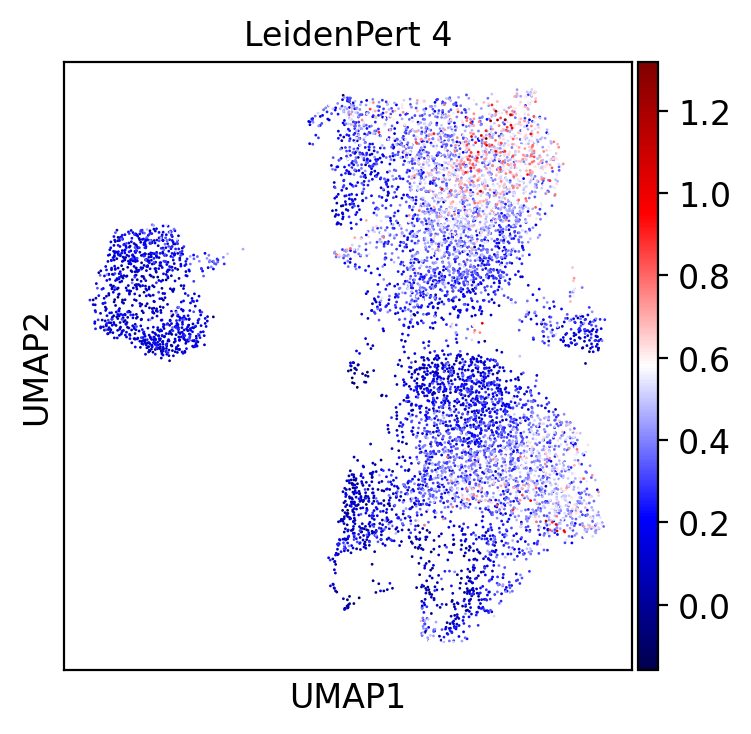

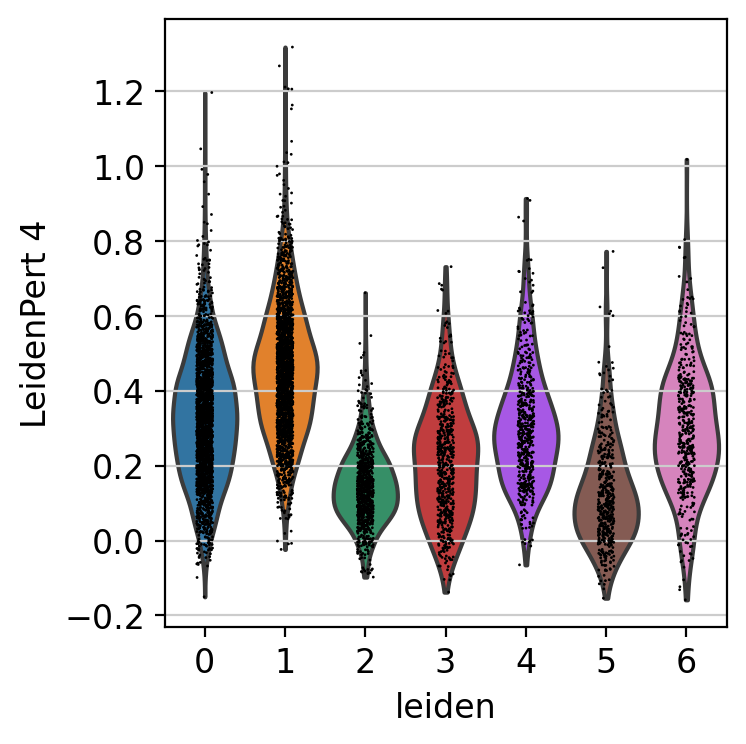

computing score 'LeidenPert 5'
    finished: added
    'LeidenPert 5', score of gene set (adata.obs).
    394 total control genes are used. (0:00:00)


/home/beraslan/miniconda3/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


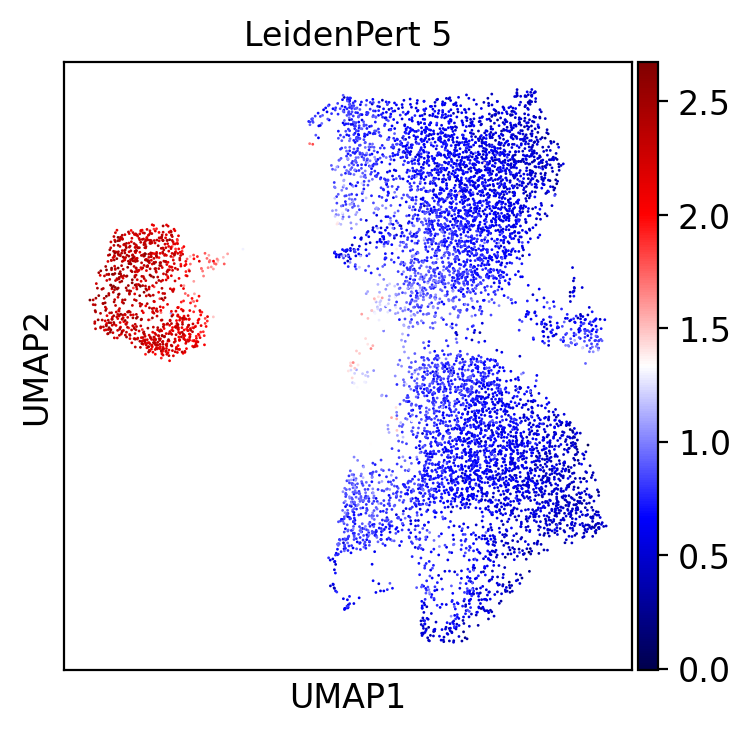

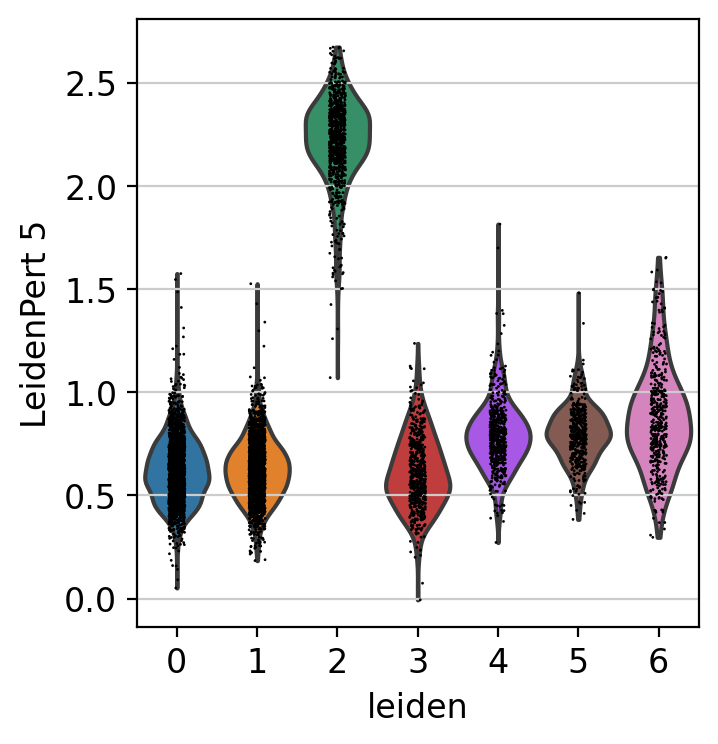

computing score 'LeidenPert 6'
    finished: added
    'LeidenPert 6', score of gene set (adata.obs).
    745 total control genes are used. (0:00:00)


/home/beraslan/miniconda3/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


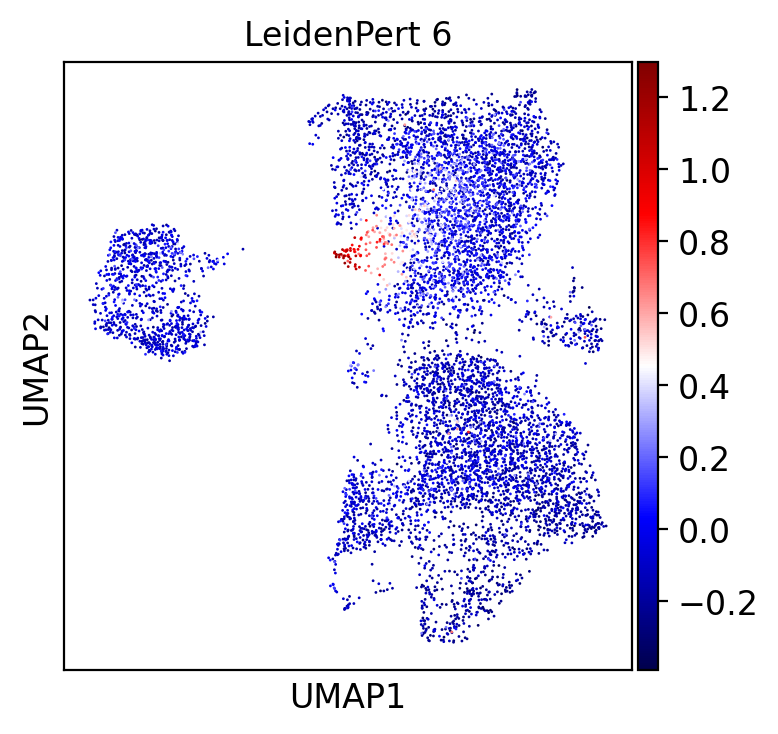

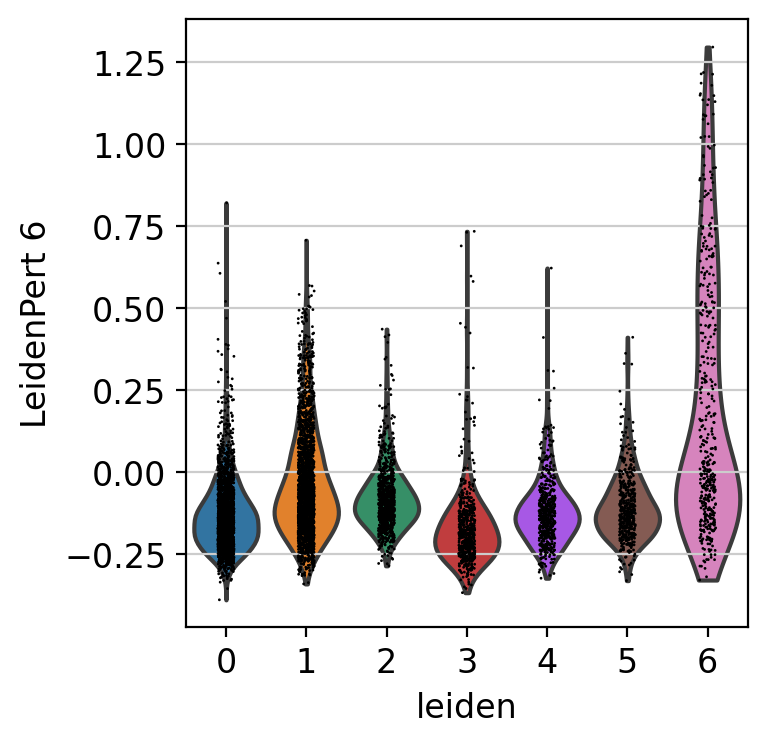

computing score 'LeidenPert 7'
    finished: added
    'LeidenPert 7', score of gene set (adata.obs).
    546 total control genes are used. (0:00:00)


/home/beraslan/miniconda3/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


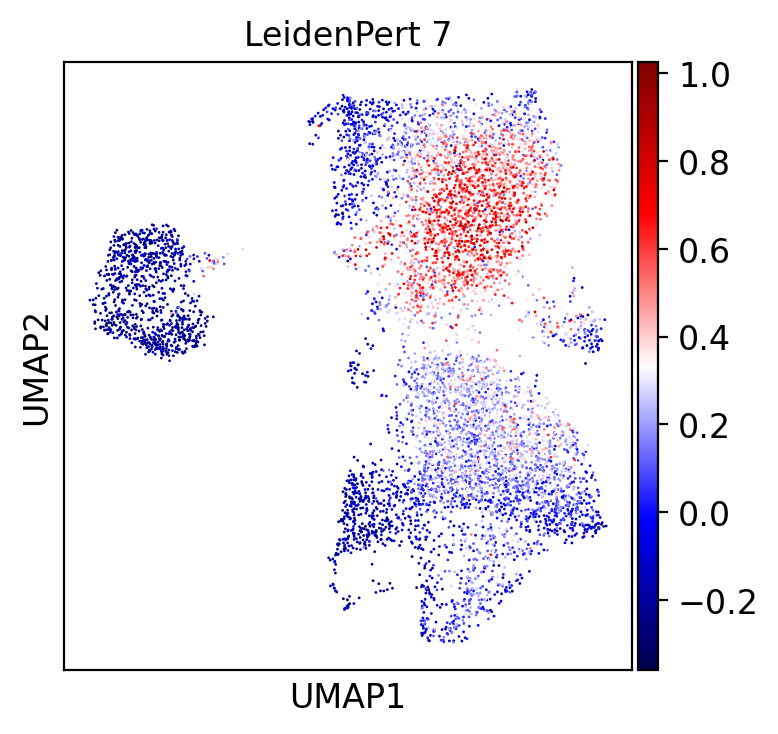

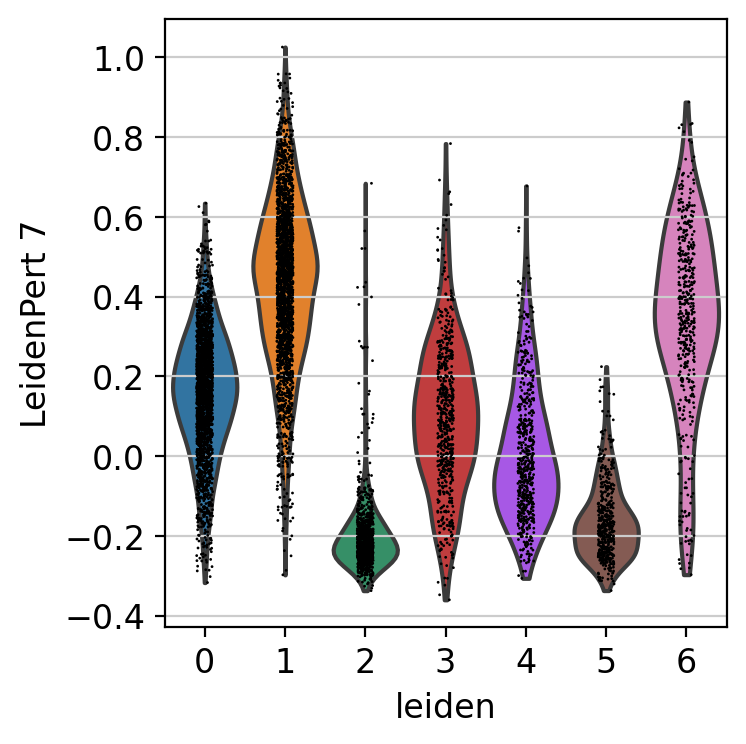

computing score 'LeidenPert 8'
    finished: added
    'LeidenPert 8', score of gene set (adata.obs).
    341 total control genes are used. (0:00:00)


/home/beraslan/miniconda3/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


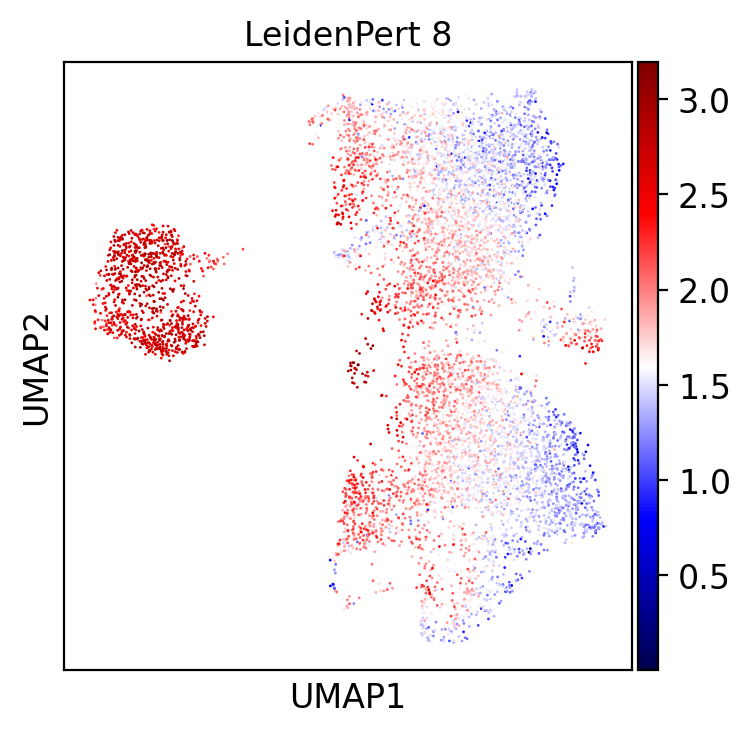

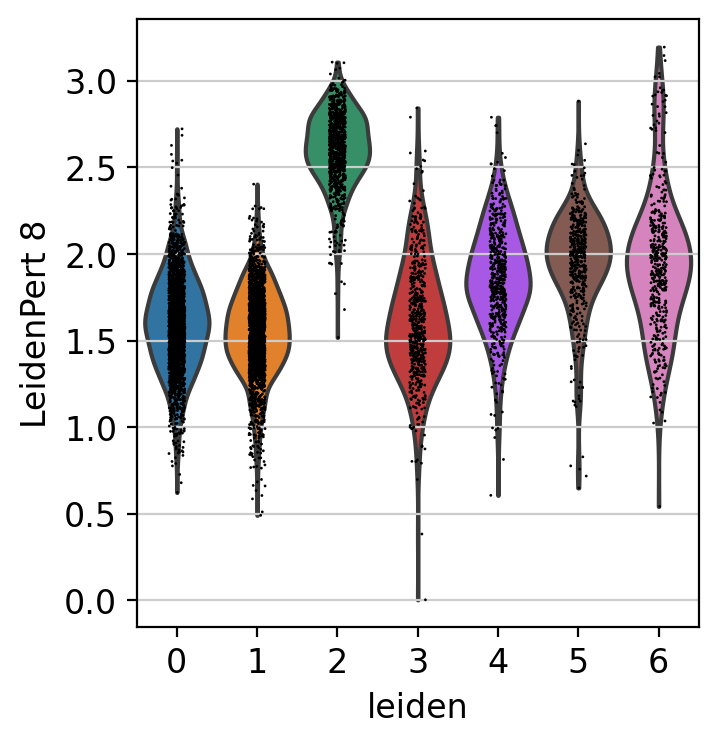

computing score 'LeidenPert 9'
    finished: added
    'LeidenPert 9', score of gene set (adata.obs).
    795 total control genes are used. (0:00:00)


/home/beraslan/miniconda3/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


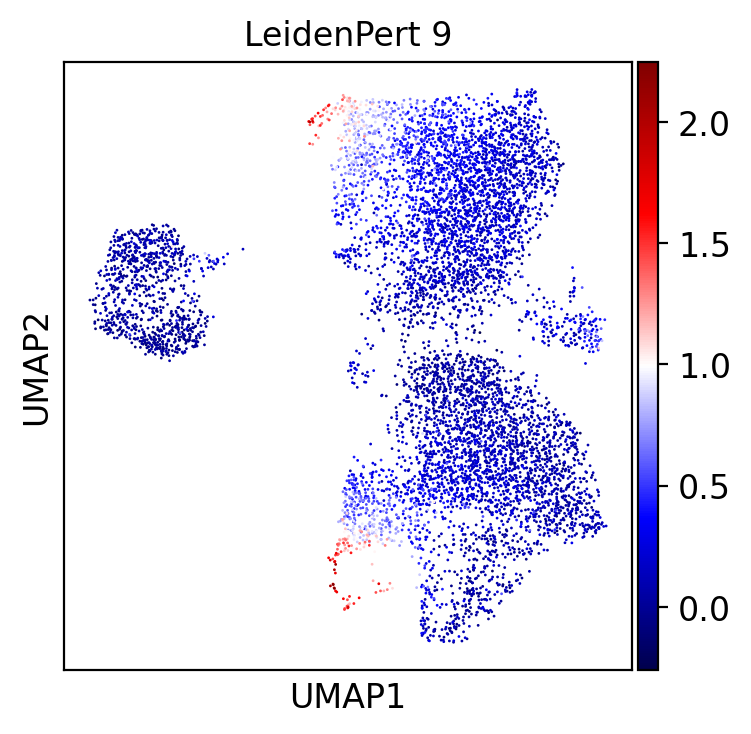

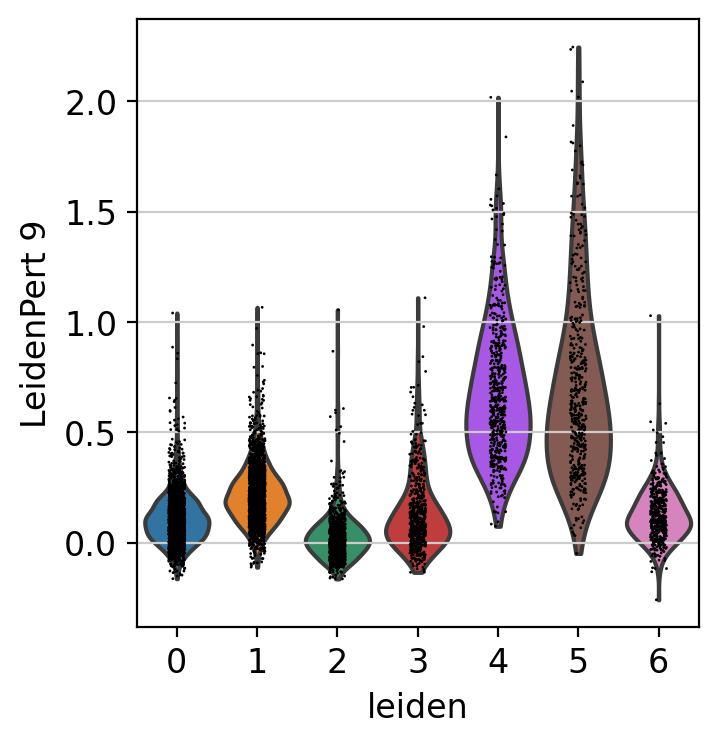

In [76]:
for i in leidenMarkersOfPerturbedCells.group.unique():
     myGeneList = leidenMarkersOfPerturbedCells.loc[leidenMarkersOfPerturbedCells.group == i,'names']
     myGeneList = [x.replace(".","-") for x in myGeneList]
     sc.tl.score_genes(adata=adataAll, gene_list=myGeneList, score_name="LeidenPert "+str(i))
     sc.pl.umap(adataAll, color="LeidenPert "+str(i), size=4, color_map="seismic")
     sc.pl.violin(adataAll, "LeidenPert "+str(i), groupby='leiden')

In [88]:
adataAll.obs['Leiden0Type']=0
adataAll.obs.loc[adataAll.obs["LeidenPert 0"] > 0.5,'Leiden0Type']=1
adataAll.obs['Leiden4Type']=0
adataAll.obs.loc[adataAll.obs["LeidenPert 4"] > 0.5,'Leiden4Type']=1
adataAll.obs['Leiden6Type']=0
adataAll.obs.loc[adataAll.obs["LeidenPert 6"] > 0.5,'Leiden6Type']=1
adataAll.obs['Leiden7Type']=0
adataAll.obs.loc[adataAll.obs["LeidenPert 7"] > 0.5,'Leiden7Type']=1
adataAll.obs['Leiden8Type']=0
adataAll.obs.loc[adataAll.obs["LeidenPert 8"] > 1.5,'Leiden8Type']=1
adataAll.obs['Leiden9Type']=0
adataAll.obs.loc[adataAll.obs["LeidenPert 9"] > 0.5,'Leiden9Type']=1

In [80]:
pd.crosstab(adataAll.obs['type'],adataAll.obs['Leiden0Type'])

Leiden0Type,0,1
type,,
LPSMinus,2659,996
LPSPlus,1588,2439


In [81]:
pd.crosstab(adataAll.obs['type'],adataAll.obs['Leiden4Type'])

Leiden4Type,0,1
type,,
LPSMinus,3274,381
LPSPlus,3040,987


In [83]:
pd.crosstab(adataAll.obs['type'],adataAll.obs['Leiden6Type'])

Leiden6Type,0,1
type,,
LPSMinus,3645,10
LPSPlus,3907,120


In [85]:
pd.crosstab(adataAll.obs['type'],adataAll.obs['Leiden7Type'])

Leiden7Type,0,1
type,,
LPSMinus,3617,38
LPSPlus,3011,1016


In [89]:
pd.crosstab(adataAll.obs['type'],adataAll.obs['Leiden8Type'])

Leiden8Type,0,1
type,,
LPSMinus,1081,2574
LPSPlus,1123,2904


In [90]:
pd.crosstab(adataAll.obs['type'],adataAll.obs['Leiden9Type'])

Leiden9Type,0,1
type,,
LPSMinus,3346,309
LPSPlus,3521,506


In [66]:
adataAll.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,type,leiden,DC1,DC2,mreg,...,LeidenPert 1,LeidenPert 2,LeidenPert 3,LeidenPert 4,LeidenPert 5,LeidenPert 6,LeidenPert 7,LeidenPert 8,LeidenPert 9,Leiden0Type
AAACCCACAGAGTGAC-1,2330,2328,7273.0,510.0,7.012237,LPSMinus,0,-0.059955,0.215661,-0.025872,...,0.133470,0.948091,-0.086341,0.346615,1.111217,0.146324,0.250058,1.668914,0.037777,0
AAACCCAGTATTTCGG-1,1089,1086,2954.0,246.0,8.327691,LPSMinus,2,-0.048304,0.124332,0.378121,...,0.076533,0.400430,0.025276,0.142451,2.331486,0.144780,-0.229572,2.439869,0.047092,0
AAACCCATCCATAAGC-1,2356,2352,6671.0,400.0,5.996102,LPSMinus,0,-0.060289,0.234031,0.020907,...,0.430404,0.391078,-0.088082,0.249862,0.917605,-0.040635,0.292052,1.529609,0.214659,1
AAACGAAAGATCCAAA-1,2384,2383,8412.0,572.0,6.799809,LPSMinus,0,-0.030845,0.246889,-0.000025,...,0.605003,0.382652,-0.065655,0.400894,0.771168,-0.046558,-0.088710,1.284337,0.199380,0
AAACGAACATAGGCGA-1,2471,2470,7961.0,696.0,8.742620,LPSMinus,0,-0.004003,0.167946,-0.033436,...,0.067728,0.992578,-0.091458,0.131624,1.044779,-0.089591,0.253510,1.866195,0.026097,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGAGGTGCATTTG-1,1799,1798,4977.0,303.0,6.088005,LPSPlus,1,-0.037437,0.294737,0.033887,...,0.491335,0.520961,-0.093222,0.396395,0.750795,0.054766,0.208332,1.372195,0.199595,1
TTTGGTTGTGCATTTG-1,1686,1684,5159.0,305.0,5.911998,LPSPlus,1,-0.070629,0.242128,0.054208,...,0.273525,0.672576,-0.078770,0.295137,1.061078,0.132248,0.372726,1.596314,0.196085,1
TTTGGTTTCCCTGTTG-1,1962,1959,5440.0,368.0,6.764706,LPSPlus,1,0.004808,0.206906,0.037882,...,0.119637,1.115526,-0.058171,0.154645,1.055682,0.056494,0.373109,1.694036,0.162240,0
TTTGGTTTCGCCAACG-1,1978,1978,5498.0,394.0,7.166243,LPSPlus,1,-0.059838,0.263271,0.055759,...,0.289964,0.699685,-0.071499,0.277705,0.870705,0.162476,0.486500,1.603410,0.149102,1


In [ ]:
markerGenes = pd.DataFrame(adataAll.uns['rank_genes_groups']['names'])
markerGenes = markerGenes.iloc[0:10,:]
markerGenes = np.unique(markerGenes.values.flatten())

In [ ]:
markerGenes

In [ ]:
# sc.pl.matrixplot(adataAll, markerGenes, groupby='leiden', dendrogram=True,
#                       use_raw=False, vmin=-3, vmax=3,cmap='bwr',  swap_axes=True, figsize=(10,14))

In [ ]:
# sc.pl.heatmap(adataAll, markerGenes, groupby='leiden', figsize=(20, 10),
#               use_raw=False, vmin=-3, vmax=3, cmap='bwr', show_gene_labels=True, dendrogram=True, swap_axes=False)

In [ ]:
sc.tl.rank_genes_groups(adataAll, 'leiden', method='t-test_overestim_var', key_added = "t-test_ov")


In [ ]:
sc.pl.rank_genes_groups_heatmap(adataAll, n_genes=15,key="t-test_ov", groupby="leiden", show_gene_labels=True, vmax=5)


In [ ]:
sc.pl.rank_genes_groups_dotplot(adataAll, n_genes=10, key="t-test_ov", groupby="leiden")


In [ ]:
sc.pl.rank_genes_groups_matrixplot(adataAll, n_genes=10, key="t-test_ov", groupby="leiden")


In [ ]:
sc.tl.rank_genes_groups(adataAll, 'type', method='t-test_overestim_var')


In [ ]:
DEgenes = sc.get.rank_genes_groups_df(adataAll, group='LPSPlus')

In [ ]:
DEgenes = DEgenes.loc[DEgenes.pvals_adj < 0.05,:]

In [ ]:
np.abs(DEgenes.logfoldchanges)

In [ ]:
DEgenes.loc[np.abs(DEgenes.logfoldchanges) > 0.5,:]

In [ ]:
DEgenes = DEgenes.loc[np.abs(DEgenes.logfoldchanges) > 0.5,:]

In [ ]:
DEgenes[["TestCondition"]] = "LPSPlusOverMinus"

In [ ]:
DEgenes.shape

In [ ]:
DEgenes.to_csv("LPSPlusOverMinusDEGenes.csv", index=False)

In [ ]:
sns.boxplot(x=DEgenes["logfoldchanges"])

In [ ]:
adataAll.uns['rank_genes_groups']

In [ ]:
adataAll.uns['rank_genes_groups']['logfoldchanges']

In [ ]:
adataAll.uns['rank_genes_groups']['names']

In [ ]:
adataAll.uns['rank_genes_groups']['pvals_adj']

In [ ]:
pd.DataFrame({"GeneNames":adataAll.uns['rank_genes_groups']['names'],
              "logFC":adataAll.uns['rank_genes_groups']['logfoldchanges'],
              "pValAdj":adataAll.uns['rank_genes_groups']['pvals_adj']})


In [ ]:
result = adataAll.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']})


In [ ]:
genes1 = sc.get.rank_genes_groups_df(adataAll, group='LPSPlus')['names']

In [ ]:
genes1

In [ ]:
sc.pl.rank_genes_groups_dotplot(adataAll, n_genes=100, groupby="type")


In [ ]:
adataAll.uns